## L2D Assignment - Machine Learning 5:

This notebook contains your assignment questions for the Clustering Images  lesson. Please attempt and complete all questions. The topics this assignment will assess are:

1. Clustering Images


When you have completed your assignment, please commit the changes to your GitHub repository's 'Assignments' folder, as instructed in the [Assignments section](https://learntodiscover.github.io/L2D-Handbook/section7.html) of the [L2D Handbook](https://learntodiscover.github.io/L2D-Handbook).


In this assignment, we ask you to use the same set of images as in the work- through example described in the lesson. However, instead of GMM, we want you to try a different clustering method called __KMeans__. The documentation for KMneans is available here: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html. Some examples of how kmeans clustering can go wrong are shown in [this example code](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_assumptions.html#sphx-glr-auto-examples-cluster-plot-kmeans-assumptions-py).


Using `KMeans` from 'sklearn.cluster', do the following tasks:


In [23]:
# Import all the functions needed for this task 
from numpy import zeros, concatenate, sum, stack, array
import nibabel as nib
from matplotlib.pyplot import subplots, tight_layout, show
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import seaborn as sns
from pandas import DataFrame
from itertools import combinations
from sklearn.mixture import GaussianMixture

#MTS: Correct import statements, importing all necessary packages, modules and functions.

## Using Nibabel

### Part 1 - Loading and analyzing data

In [3]:
# Using the nibabel function to load the .nii image files 
img1_nib = nib.load("Data/adc.nii")
img2_nib = nib.load("Data/flair.nii")
img3_nib = nib.load("Data/t1_contrast.nii")
img4_nib = nib.load("Data/t1.nii")

#MTS: Correct use of nibabel to read medical image into memory, using the .load() method. 

In [4]:
# Get and display the metadata for each image file, via using the header function 
# Obtain and display spatial and temporal units from each image file 

# Image 1 
img1_hdr = img1_nib.header
img1_unit = img1_hdr.get_xyzt_units()
print("The format of 'adc.nii' image data set {} \n\nAnd it's units {}.".format(img1_hdr,img1_unit))

The format of 'adc.nii' image data set <class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : np.bytes_(b'')
db_name         : np.bytes_(b'')
extents         : 0
session_error   : 0
regular         : np.bytes_(b'r')
dim_info        : 0
dim             : [  3 256 256  32   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.      1.0938  1.0938  5.     10.      0.      0.      0.    ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : np.bytes_(b'5.0.11')
aux_file        : np.bytes_(b'')
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 1.0
q

In [5]:
# Image 2
img2_hdr = img2_nib.header
img2_unit = img2_hdr.get_xyzt_units()
print("The format of 'flair.nii' image data set {} \n\nAnd it's units {}.".format(img2_hdr,img2_unit))

The format of 'flair.nii' image data set <class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : np.bytes_(b'')
db_name         : np.bytes_(b'')
extents         : 0
session_error   : 0
regular         : np.bytes_(b'r')
dim_info        : 0
dim             : [  3 256 256  32   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.      1.0938  1.0938  5.      0.      0.      0.      0.    ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : np.bytes_(b'5.0.11')
aux_file        : np.bytes_(b'')
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 1.0

In [6]:
# Image 3
img3_hdr = img3_nib.header
img3_unit = img3_hdr.get_xyzt_units()
print("The format of 't1_contrast.nii' image data set {} \n\nAnd it's units {}.".format(img3_hdr,img3_unit))

The format of 't1_contrast.nii' image data set <class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : np.bytes_(b'')
db_name         : np.bytes_(b'')
extents         : 0
session_error   : 0
regular         : np.bytes_(b'r')
dim_info        : 0
dim             : [  3 256 256  32   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.      1.0938  1.0938  5.      0.      0.      0.      0.    ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : np.bytes_(b'5.0.11')
aux_file        : np.bytes_(b'')
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0
quatern_c      

In [7]:
# Image 4 
img4_hdr = img4_nib.header
img4_unit = img4_hdr.get_xyzt_units()
print("The format of 't1.nii' image data set {} \n\nAnd it's units {}.".format(img4_hdr,img4_unit))

The format of 't1.nii' image data set <class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : np.bytes_(b'')
db_name         : np.bytes_(b'')
extents         : 0
session_error   : 0
regular         : np.bytes_(b'r')
dim_info        : 0
dim             : [  3 256 256  32   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.      1.0938  1.0938  5.      0.      0.      0.      0.    ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : np.bytes_(b'5.0.11')
aux_file        : np.bytes_(b'')
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 1.0
qu

### Part 2 - Converting Image Files to NumPy array

In [8]:
# Convert each image file into NumPy array for further usage ease 
data1 = img1_nib.get_fdata()
data2 = img2_nib.get_fdata()
data3 = img3_nib.get_fdata()
data4 = img4_nib.get_fdata()

#MTS: Correct use of .get.fdata(), extracting voxel data into a NumPy array.

In [9]:
# Display the shape of each image dataset to verify dimensions
print("Shapes of the 'adc.nii' image datasets: {}". format(data1.shape))
print("Shapes of the 'flair.nii' image datasets: {}". format(data2.shape))
print("Shapes of the 't1_contrast.nii' image datasets: {}". format(data3.shape))
print("Shapes of the 't1.nii' image datasets: {}". format(data4.shape))

Shapes of the 'adc.nii' image datasets: (256, 256, 32)
Shapes of the 'flair.nii' image datasets: (256, 256, 32)
Shapes of the 't1_contrast.nii' image datasets: (256, 256, 32)
Shapes of the 't1.nii' image datasets: (256, 256, 32)


### Part 3 - Ploting Images 

In [10]:
# Select a specific slice index for the possibility of the visulaisation from the 3D image file format
# Selection of "16" seemed resonable for the "32" 3D volume of the images, getting the middle display of the brain's axis
img_slice = 16 

#MTS: 20 would be better instead of 16.

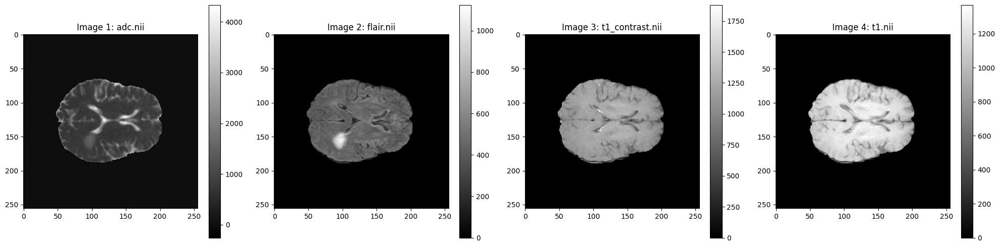

In [ ]:
# Create a figure with 1 row and 4 columns for the display of 4 image files 
fig, ax = subplots(nrows=1, ncols=4, figsize=(20, 5))

# Extract, display and annotate the selected 2D slice from each image file 
f1 = ax[0].imshow(data1[:, :, img_slice], cmap="gray")
ax[0].set_title("Image 1: adc.nii")
f2 = ax[1].imshow(data2[:, :, img_slice], cmap="gray")
ax[1].set_title("Image 2: flair.nii")
f3 = ax[2].imshow(data3[:, :, img_slice], cmap="gray")
ax[2].set_title("Image 3: t1_contrast.nii")
f4 = ax[3].imshow(data4[:, :, img_slice], cmap="gray")
ax[3].set_title("Image 4: t1.nii")

# Add colorbars to each subplot for clear visual interpretation 
fig.colorbar(f1, ax=ax[0])
fig.colorbar(f2, ax=ax[1])
fig.colorbar(f3, ax=ax[2])
fig.colorbar(f4, ax=ax[3]);

# Using tigh_layout() prevent the overlap of the subplots 
tight_layout()
show()

#MTS: Good coding and display of the initial images, using the .imshow() function.

## Pre-processing before KMeans application 

### Part 1 - Specific slice extraction 

In [12]:
# From each 3D image file obtain a 2D earlier selected & specific slice
data_slice1 = data1[:, :, img_slice]
data_slice2 = data2[:, :, img_slice]
data_slice3 = data3[:, :, img_slice]
data_slice4 = data4[:, :, img_slice]

### Part 2 - Mask creation and application 

In [13]:
# Identify a mask, removing zero-intensity values in all slices 
# This step only keeps pixels where all four image files have values greater that 0 
mask = (data_slice1>0) & (data_slice2>0) & (data_slice3>0) & (data_slice4>0)

In [14]:
# Extract nonzero values from all image file slices 
data1_nz = data_slice1[mask]
data2_nz = data_slice2[mask]
data3_nz = data_slice3[mask]
data4_nz = data_slice4[mask]

#MTS: Correct application of Boolean mask, ensuring that only non-zero values are kept.
#MTS: Correct flattening of image, by extracting only nonzero values.
#MTS: Correct storage of non-zero values into aptly named variables.

#MTS: You should use the stack() function, stacking multiple 1-D arrays (created previously) along a new axis. 

### Part 3 - Histogram plotting for the mask application display

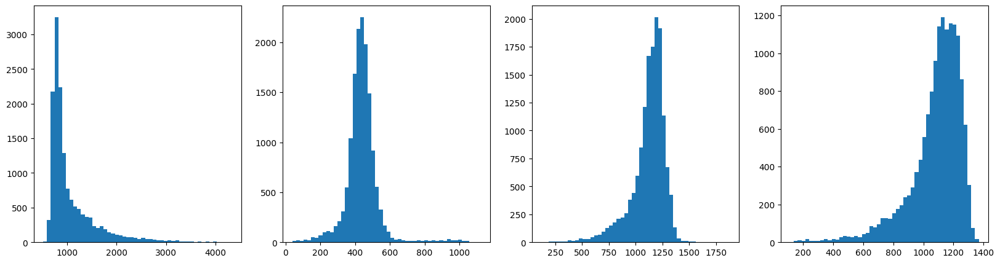

In [15]:
# Create a 1-row, 4-column figure for future histogram plots
fig, ax = subplots(nrows=1, ncols=4, figsize=(20, 5))

# Display histograms of nonzero values form each image file slice 
ax[0].hist(data1_nz, bins=50)
ax[1].hist(data2_nz, bins=50)
ax[2].hist(data3_nz, bins=50)
ax[3].hist(data4_nz, bins=50);

#MTS: Correct use of subplots to create a 1x4 grid for plotting.
#MTS: Correct use of .hist() to plot distribution of intensities for each image.

### Part 4 - Scaling of the images

In [16]:
# Import StandardScaler() for future actions 
scaler = StandardScaler()

# Using the earlier identified "scaler" choice, normalize the intensity values of each image file 
data1_scaled = scaler.fit_transform(data1_nz.reshape(-1, 1))
data2_scaled = scaler.fit_transform(data2_nz.reshape(-1, 1))
data3_scaled = scaler.fit_transform(data3_nz.reshape(-1, 1))
data4_scaled = scaler.fit_transform(data4_nz.reshape(-1, 1))

#MTS: Correct initialisation of StandardScaler and assignment to variable.
#MTS: Correct use of .fit_transform() function to transform data to have zero mean and unit variance.
#MTS: Correct use of .reshape(-1, 1), ensuring each voxel intensity is dealt with as a single feature.

### Part 5 - Concatenate to samples-features array

In [17]:
# Using concatenate(), create a feature array from the scaled data(for future clustering)
all_img_scaled = concatenate([data1_scaled, data2_scaled, data3_scaled, data4_scaled], axis=1)

# Display the shape of the final feature matrix
# The displayed shape (x,y) where "x" represents sample number and "y" the feature number 
all_img_scaled.shape

#MTS: Correct combining of images using NumPy concatenate() method.

(14905, 4)

## KMeans clustering

### Part 1 - Visualise the feature space

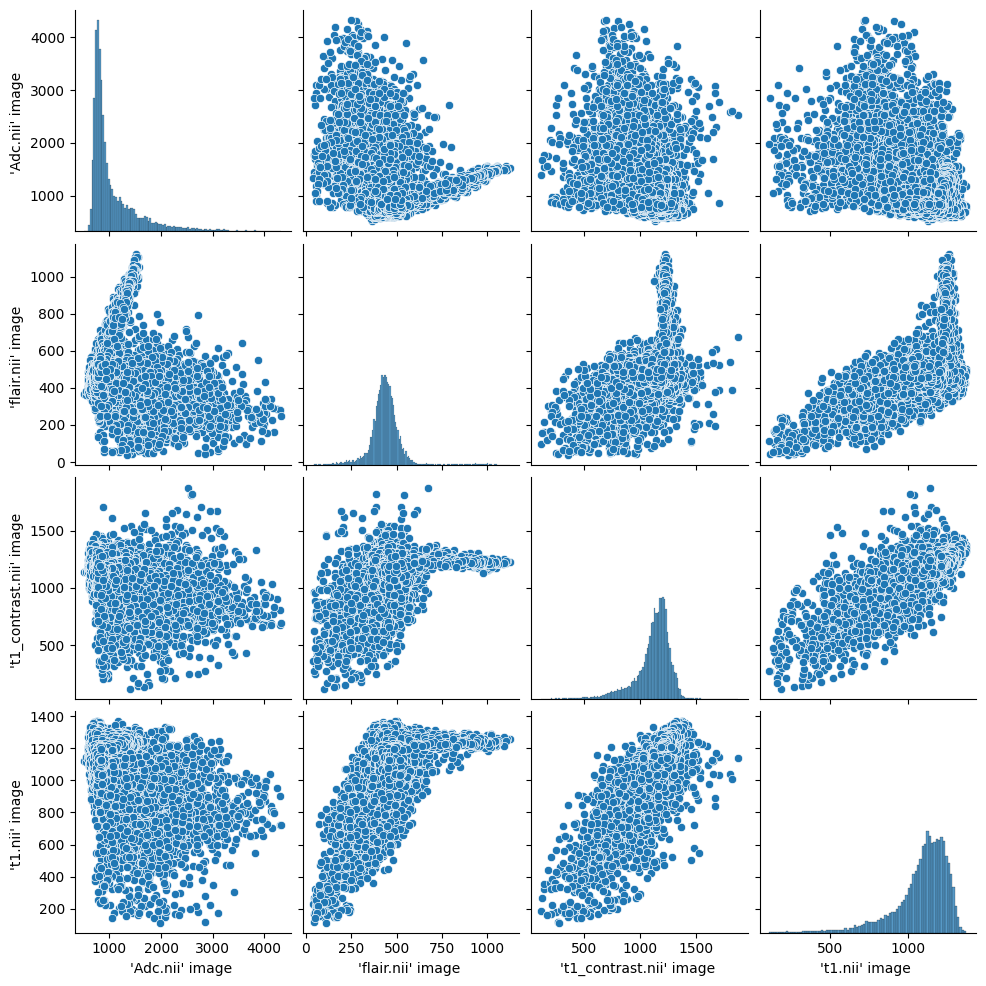

In [18]:
# Create a DataFrame containing all nonzero values of the image files assigned to correlated image file names for display clarity
df = DataFrame({
    "'Adc.nii' image ": data1_nz,
    "'flair.nii' image ": data2_nz,
    "'t1_contrast.nii' image ": data3_nz,
    "'t1.nii' image ": data4_nz,
})

# Using seaborn display pairwise scatter plots and histograms to visualize relationships between different combinations 
# of the image files, which could potentially help idenitify possible clusters and separability tendencies in the datasets 
sns.pairplot(df)
show()

### Part 2 - Optimal Cluster Number Determination 

In [19]:
# Createa a loop, identifying the testing cluster range (form 2 to 9) 
for k in range(2, 10):  

    # Initizlize KMeans with k clusters for further score calculations 
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(all_img_scaled)

    #Calculate and display silhouette score for cluster cohesion evaluation 
    score = silhouette_score(all_img_scaled, labels)
    print(f'Clusters: {k}, Silhouette Score: {score}')

#MTS: Correct import of KMeans from scikit-learn library.
#MTS: Correct use of KMeans class to specify 3 clusters, corresponding to tissue type.
#MTS: Correct creation of kmeans labels, using .fit_predict() to reshape flattened 1-D image arrays into a 2-D array, as required by KMeans.

Clusters: 2, Silhouette Score: 0.5341765038511582
Clusters: 3, Silhouette Score: 0.32792498453809804


Clusters: 4, Silhouette Score: 0.38241849210895196
Clusters: 5, Silhouette Score: 0.34271277322179566
Clusters: 6, Silhouette Score: 0.27428598188360387
Clusters: 7, Silhouette Score: 0.2895831103530793
Clusters: 8, Silhouette Score: 0.24790664359055845
Clusters: 9, Silhouette Score: 0.2589547730151643


From the obtained silhouette score, the most meaningful clusters seem to be 2, 4 and potentially 5. As scores are the highest at those cluster numbers, indicating well-defined clustering. 

### Part 3 - Fitting of the model

1. Investigate different numbers of clusters, similarly to what we did in th work through example.
2. Use different combinations of the 4 images to see how the clustering performs in different cases.

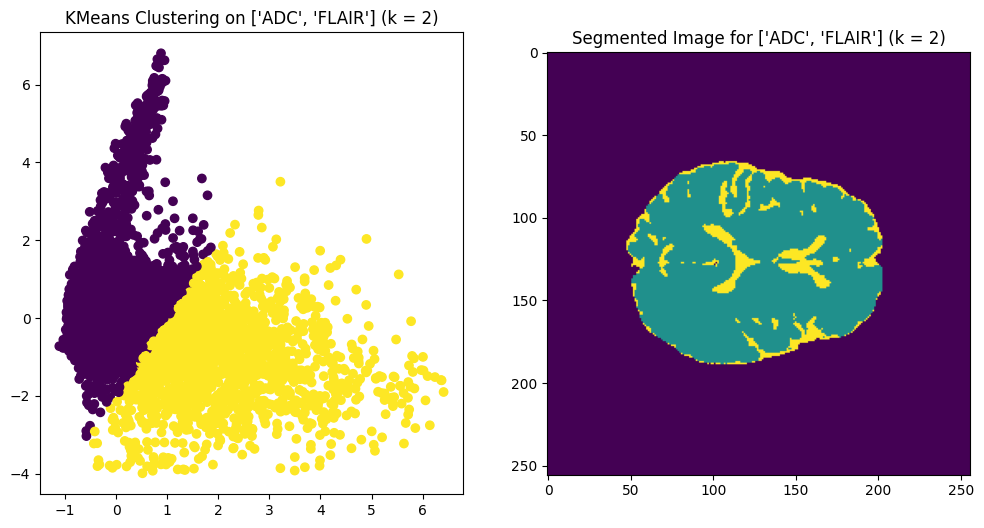

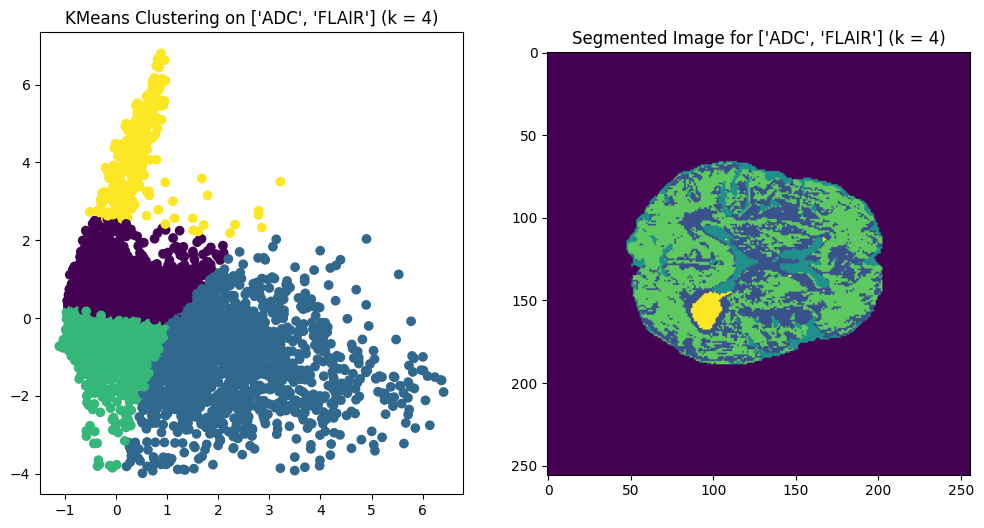

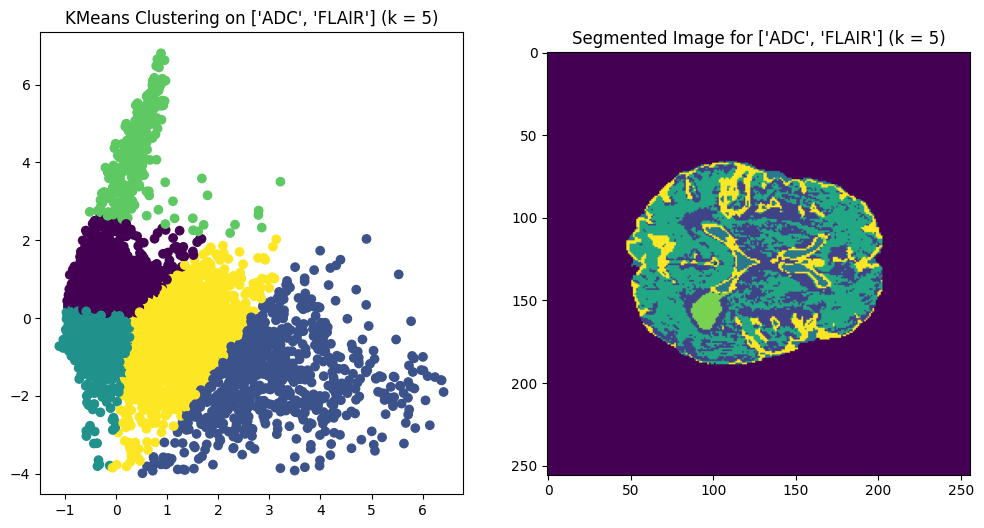

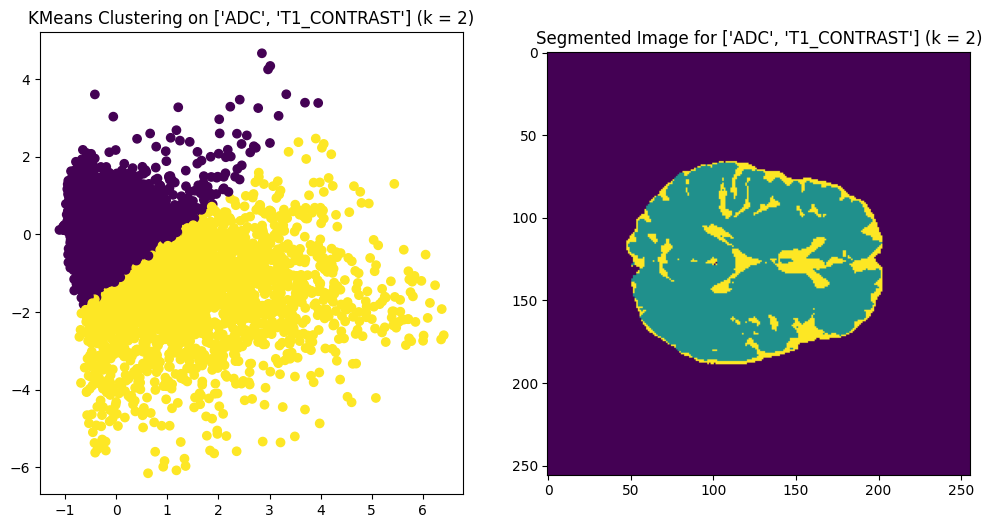

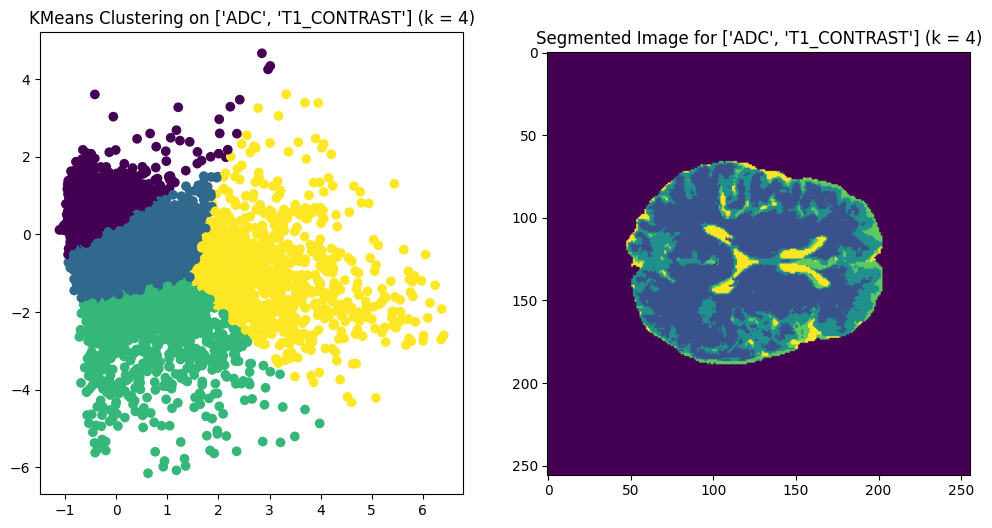

...

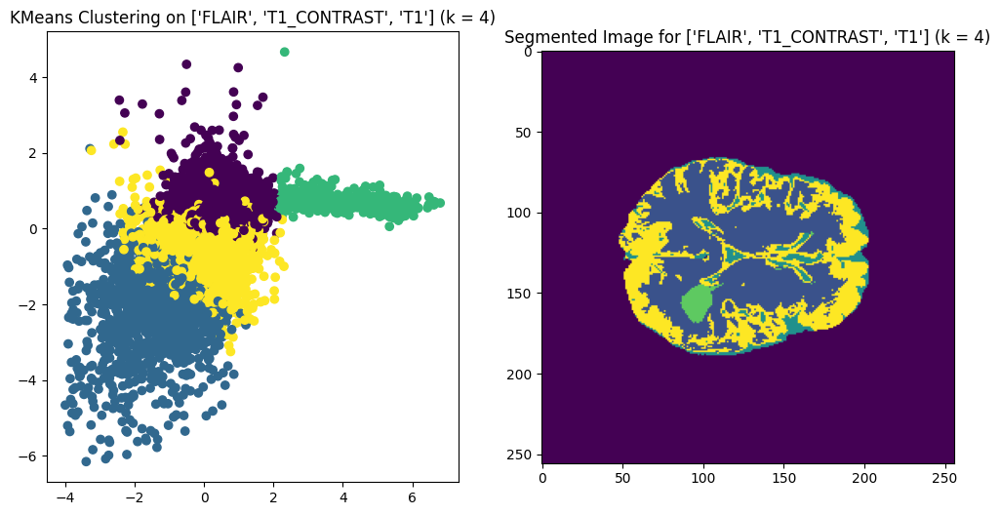

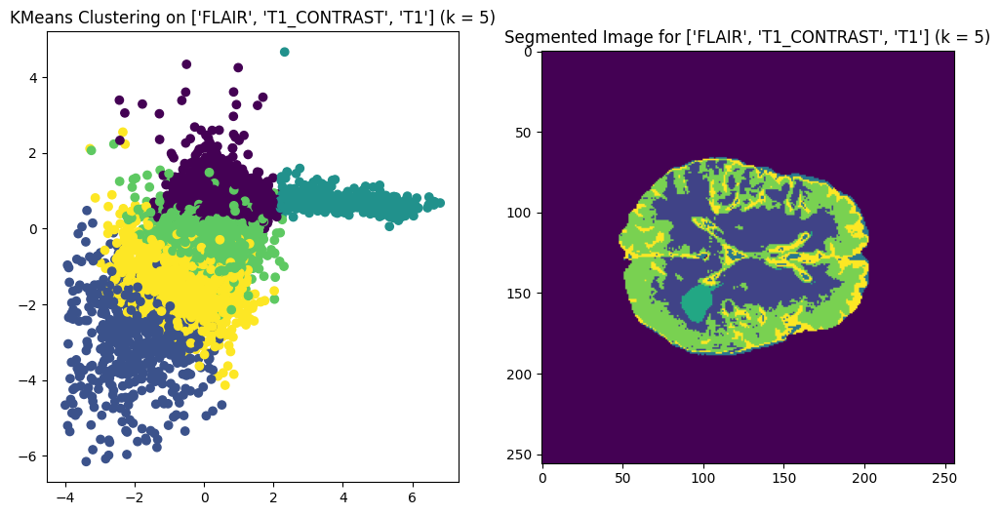

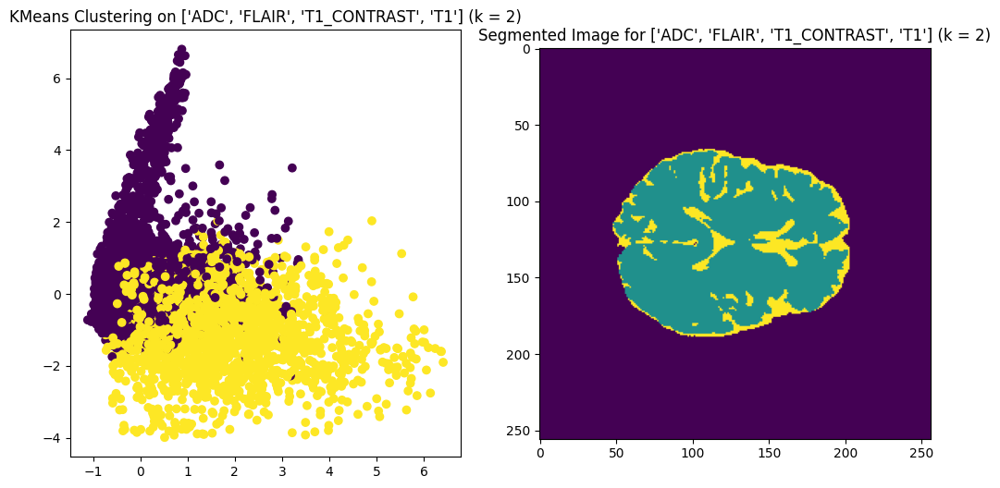

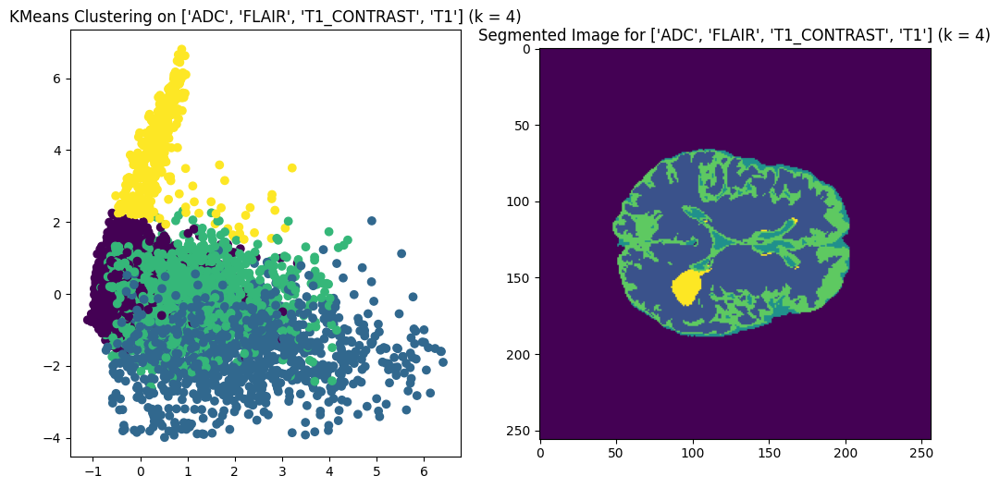

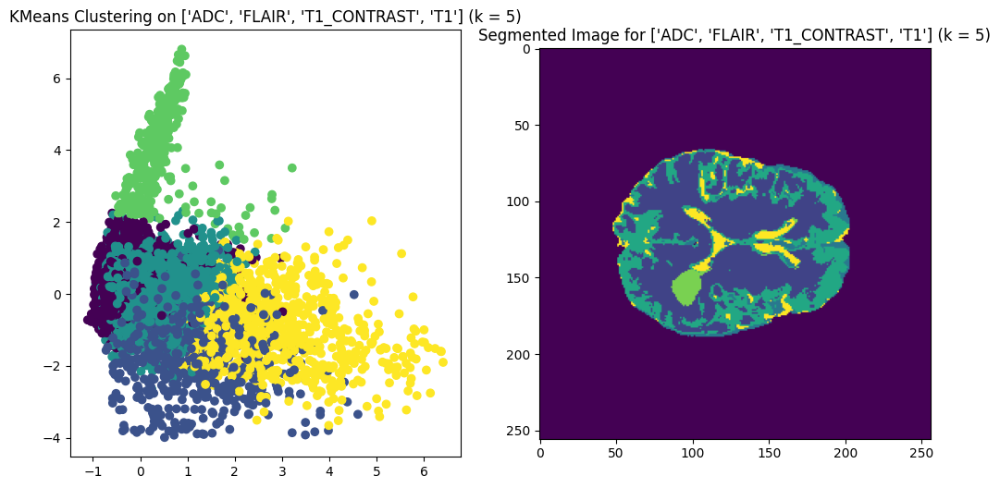

In [ ]:
# Identify the number of features (number of images being used)
num_features = all_img_scaled.shape[1]

# Define the corresponding image names for clarity 
image_names = ["ADC", "FLAIR", "T1_CONTRAST", "T1"]

# Loop through different numbers of earlier identified features(combinations of 2,3, or all 4 images)
for num_selected in range(2, 5):  

    # Generate all posible feature combinations from the image files 
    for subset in combinations(range(num_features), num_selected): 

        # Select feature names corresponding to the subset  
        selected_names = [image_names[i] for i in subset]

        # Select the corresponding feature values form the identified scaled image data
        selected_features = all_img_scaled[:, subset]
        
        # Loop through differnet numbers of clusters(selected based on silhouette scores) to analyze clustering performance 
        for n_clusters in [2,4,5]:

            # Apply KMeans clustering with the selected number of clusters and get cluster labels 
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(selected_features)

            # Shift labels to start from 1 for visual clarity 
            labels += 1
            
            # For visualization, create an empty image mask that maches the original image shape 
            all_img_labels_mapped = zeros(data_slice1.shape)

            # Make sure that labels are only assigned to nonzero pixels 
            all_img_labels_mapped[mask] = labels
            
            # Plot the clustering results 
            fig, ax = subplots(1, 2, figsize=(12, 6))
            
            # Show the scatter plot of the selected feature space with cluster labels 
            ax[0].scatter(selected_features[:, 0], selected_features[:, 1], c=labels, cmap="viridis")
            ax[0].set_title(f"KMeans Clustering on {selected_names} (k = {n_clusters})")
            
            # Display the segmented image based on clustering 
            ax[1].imshow(all_img_labels_mapped[:, :], cmap='viridis')
            ax[1].set_title(f"Segmented Image for {selected_names} (k = {n_clusters})")

            show()

#MTS: Correct running of KMeans clustering on scaled voxel intensities, assigning one of three labels to each voxel.
#MTS: Correct use of '=+ 1' to shift label trios by 1 each time, to make for clearer interpretation.
#MTS: Correct mapping of clustered voxels back to initial image dimensions.
#MTS: Correct application of KMeans to all images.

#MTS: Correct visualistion of each clustered MRI slice.
#MTS: Correct specification of a matplotlib colour map using cmap keyword argument.
#MTS: Correct use of .set_title() function to aptly title each visualised image.

#MTS: Correct use of .scatter() to plot scatter plots of voxel intensities between pairwise combinations of MRI images.
#MTS: Correct use of show() function to display final result.
#MTS: You should use subplots() to compress the outputs into a smaller figure, as this is quite long.

3. The labelled results using all four images may not look as clean as the ones in the work-through example. Try scaling the images e.g. using the sklearn standard scaler, and combining the scaled images. Do the results change? If yes, explore and comment on why you think scaling may be advantageous in this clustering example.

In [22]:
# Identify the unscaled data, use concatenate() to arrange the selected image files along a new axis 
# Use the "[:, None]" operation to reshape the 1D format of image files into a 2D array(ensuring a correct formation in a matrix)
all_img_unscaled = concatenate([data1_nz[:, None], data2_nz[:, None], data3_nz[:, None], data4_nz[:, None]], axis=1)

# Verify dimensions for the future use 
print("Unscaled data shape:", all_img_unscaled.shape)
print("Selected Features Shape:", selected_features.shape)
print("Mask Sum:", mask.sum())

#MTS: The scaled data should be used for this question and the unscaled for Q1 and Q2. You have done it the other way around, 
#but this does not matter too much.

Unscaled data shape: (14905, 4)
Selected Features Shape: (14905, 4)
Mask Sum: 14905


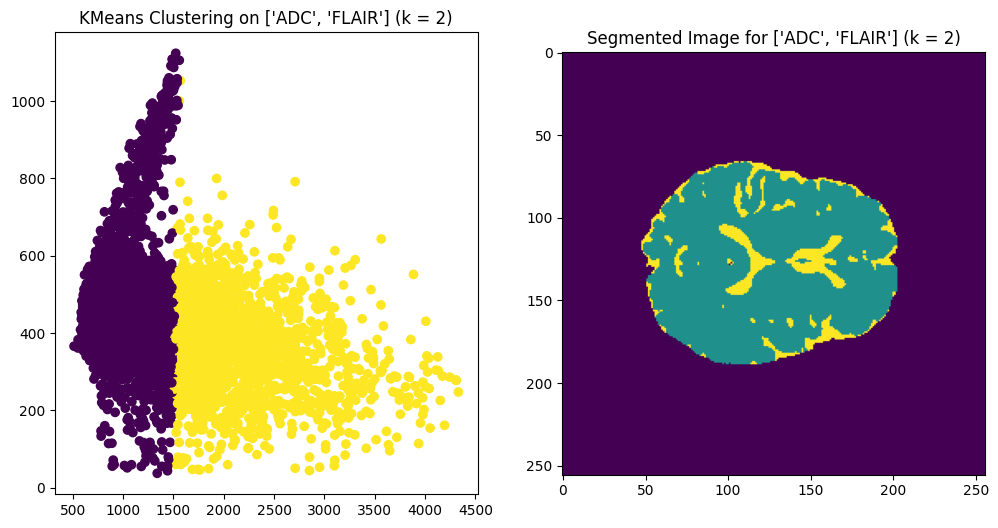

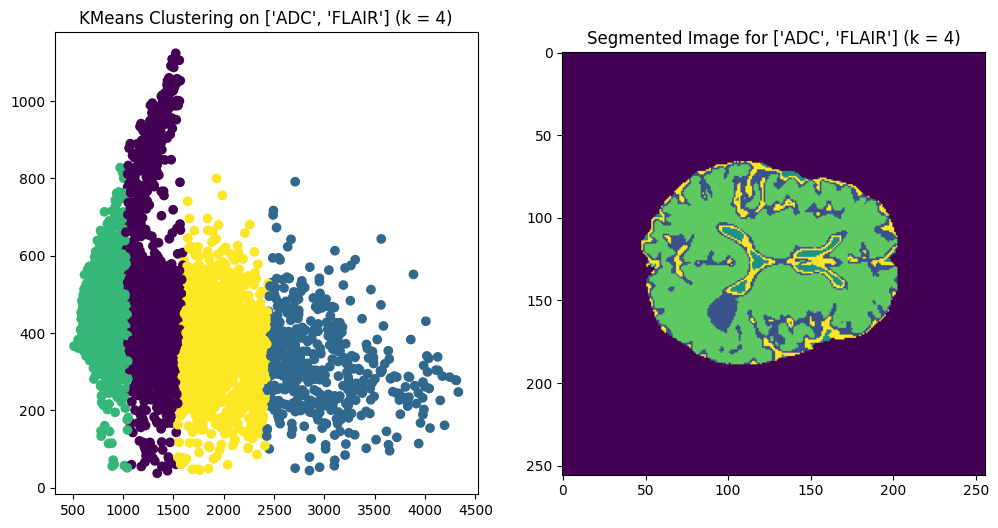

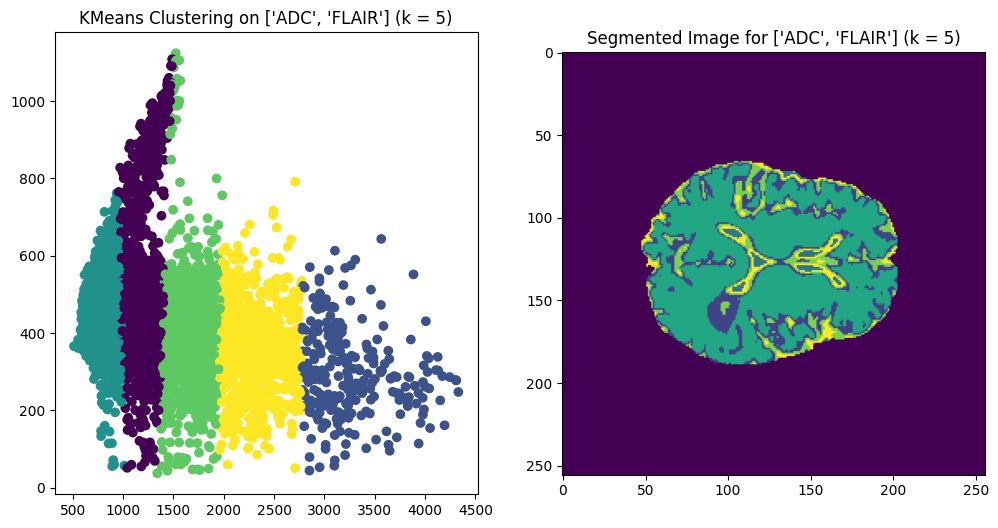

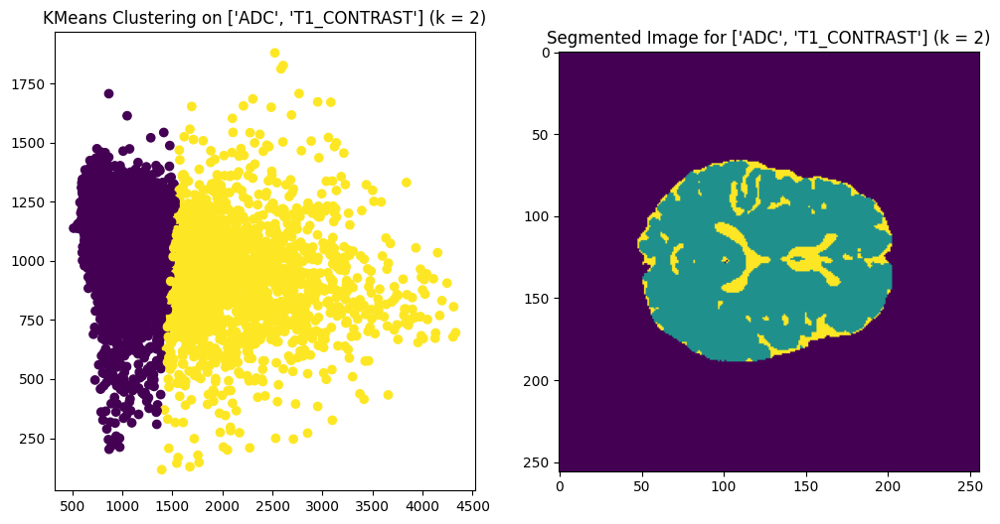

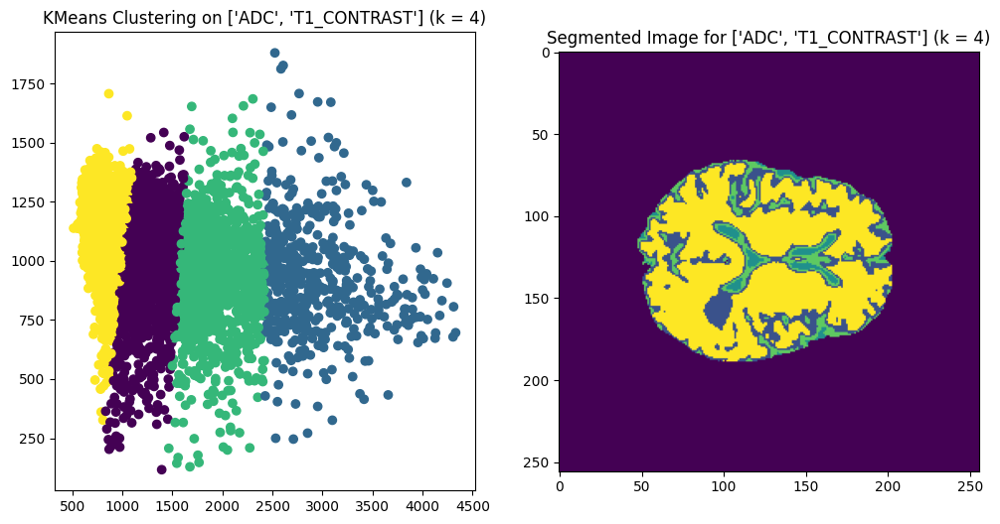

...

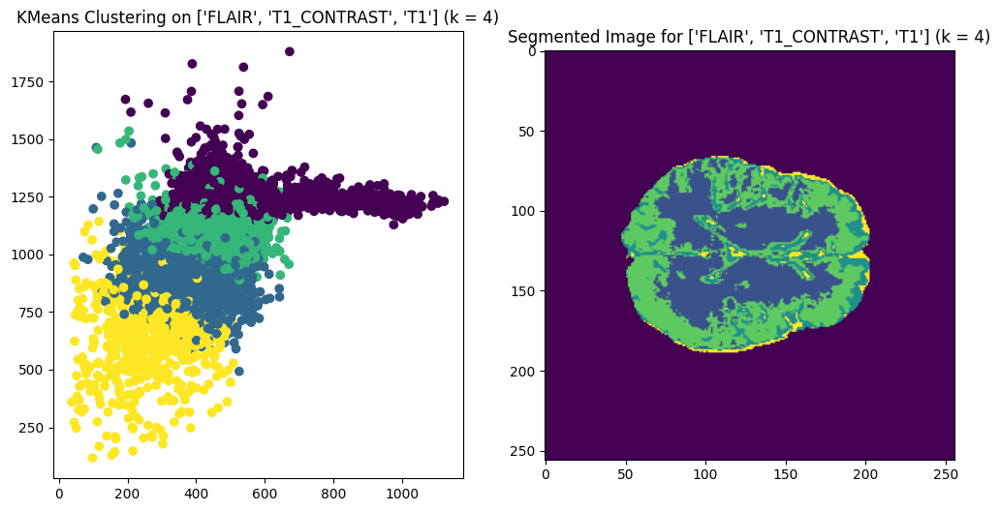

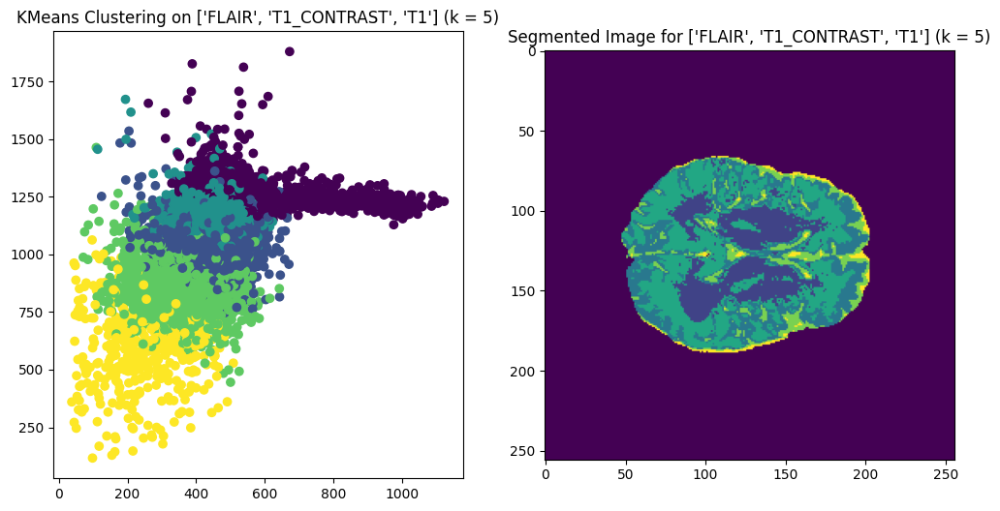

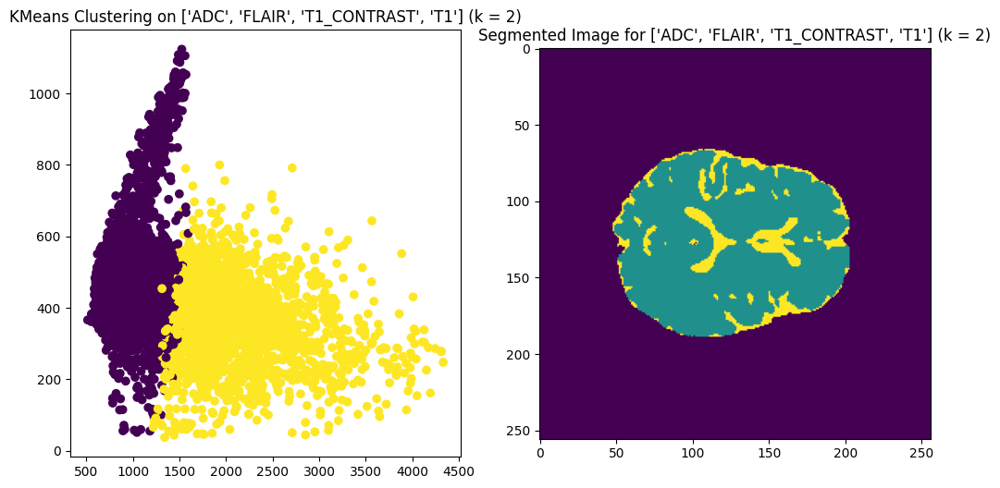

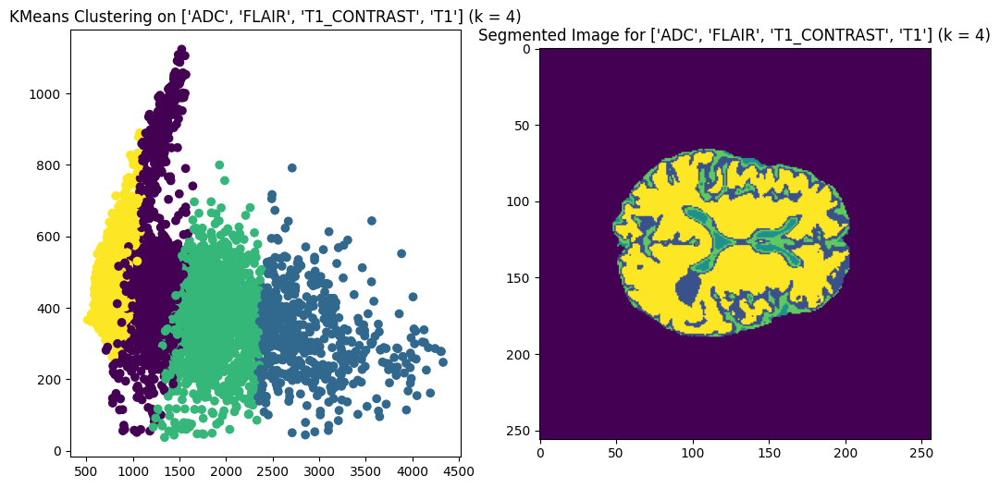

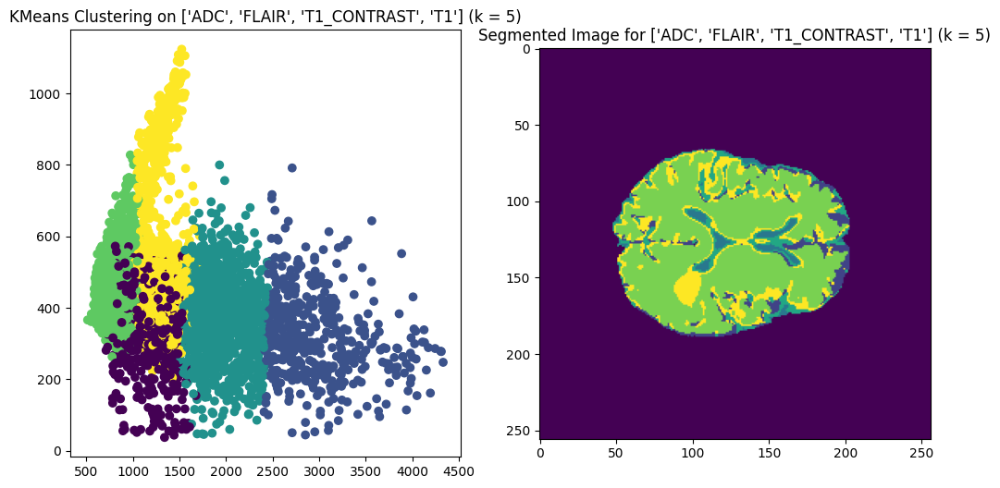

In [23]:
# Identify the number of features (number of images being used)
num_features = all_img_unscaled.shape[1]

# Define the corresponding image names for clarity 
image_names = ["ADC", "FLAIR", "T1_CONTRAST", "T1"]

# Loop through different numbers of earlier identified features(combinations of 2,3, or all 4 images)
for num_selected in range(2, 5):  

    # Generate all posible feature combinations from the image files 
    for subset in combinations(range(num_features), num_selected): 

        #subset = tuple(subset)

        # Select feature names corresponding to the subset  
        selected_names = [image_names[i] for i in subset]

        # Select the corresponding feature values form the identified unscaled image data
        selected_features = all_img_unscaled[:, subset ]
        
        # Loop through differnet numbers of clusters(selected based on silhouette scores) to analyze clustering performance 
        for n_clusters in [2,4,5]:

            # Apply KMeans clustering with the selected number of clusters and get cluster labels 
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(selected_features)

            # Shift labels to start from 1 for visualization clarity 
            labels += 1
            
            # For visualization, create an empty image mask that maches the original image shape 
            all_img_labels_mapped = zeros(data_slice1.shape)


            # Make sure that labels are only assigned to nonzero pixels 
            all_img_labels_mapped[mask] = labels
            
            # Plot the clustering results 
            fig, ax = subplots(1, 2, figsize=(12, 6))
            
            # Show the scatter plot of the selected feature space  with cluster labels 
            ax[0].scatter(selected_features[:, 0], selected_features[:, 1], c=labels, cmap="viridis")
            ax[0].set_title(f"KMeans Clustering on {selected_names} (k = {n_clusters})")
            
            # Display the segmented image based on clustering 
            ax[1].imshow(all_img_labels_mapped[:, :], cmap='viridis')
            ax[1].set_title(f"Segmented Image for {selected_names} (k = {n_clusters})")

            show()

#MTS: Correct repetition of the assignment workflow for the unscaled data this time.
#MTS: As before use subplots() to condense the outputs into a single smaller figure, as this is quite long to look through.

In [ ]:
#MTS: Good observations given below.

Note:

I have scaled the data obtained from the image files as part of the main task, so I have included the unsclaed data later on for this specific answer demonstration(I hope it's okay and I apologize for the confusion in advance).

The Answer:

1 - The visible result differences:
- After scaling, the scatter plots appear more evenly distributed and well-separated. In contrast, the unscaled versions have a more compact, skewed distribution.
- It can be noticed on the scatter plots that scalling normalizes feature magnitudes, which can reduce the apparent separation between clusters, making them appear more overlapping. 
- The segmented brain images show more distinct, refined regions in the scaled data, compared to the unscaled version, where segmentation appears coarser, potentially missing finer regional structures. In addition, the color regions in the scaled segmentation appear finer and more localized, indicating better cluster differentiation.


2 - Why Scaling is Advantageous:
- For the feature standardization reasons: medical images have intensity values with different scales. KMeans and other distance-based algorithms rely on feature magnitudes, without scaling, higher-value features dominate clustering, leading to biased results.
- For improved segmentation clarity: scaling improves segmentation clarity by enhancing the visibility of distinct regions within the brain slices, making interpretation easier and potentionally improving diagnostic accuracy.   

4. Compare the behaviour of `KMeans` to the outcome with `GaussianMixture`.

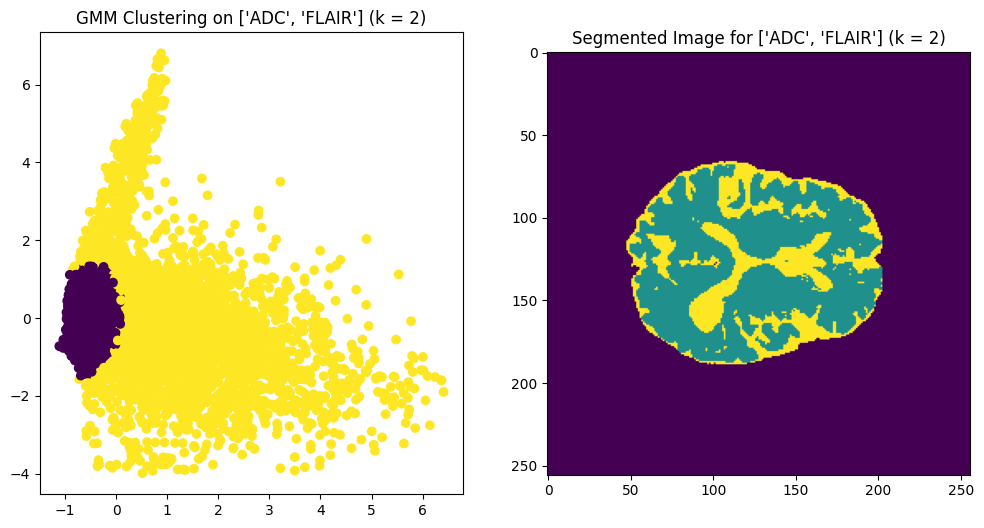

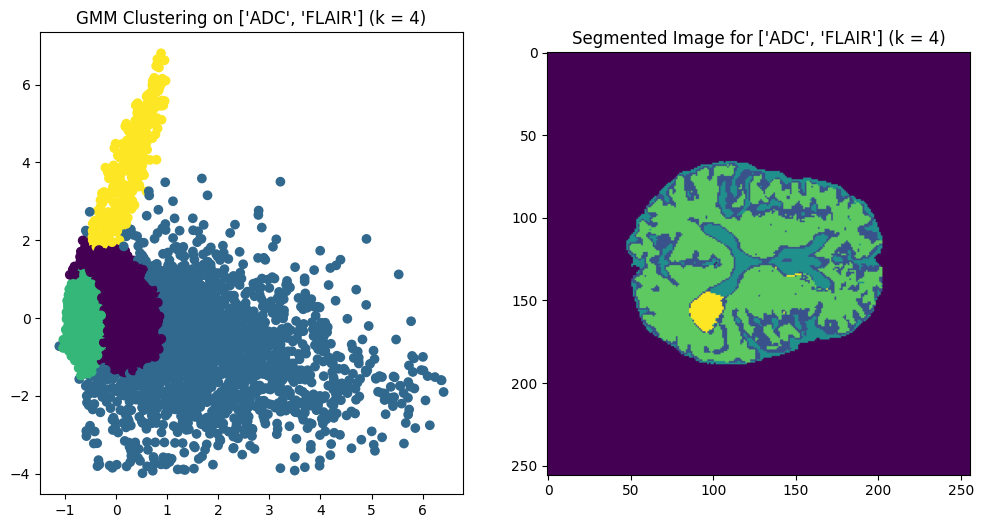

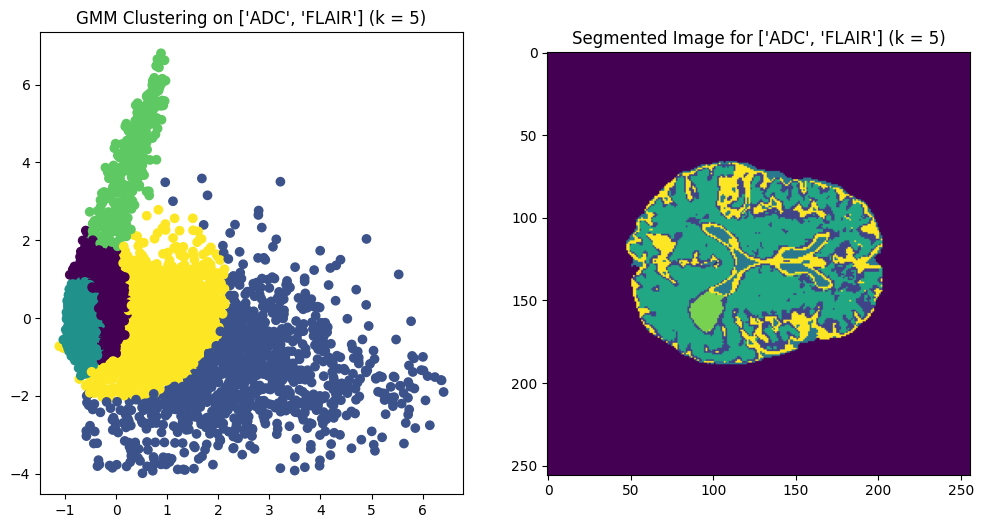

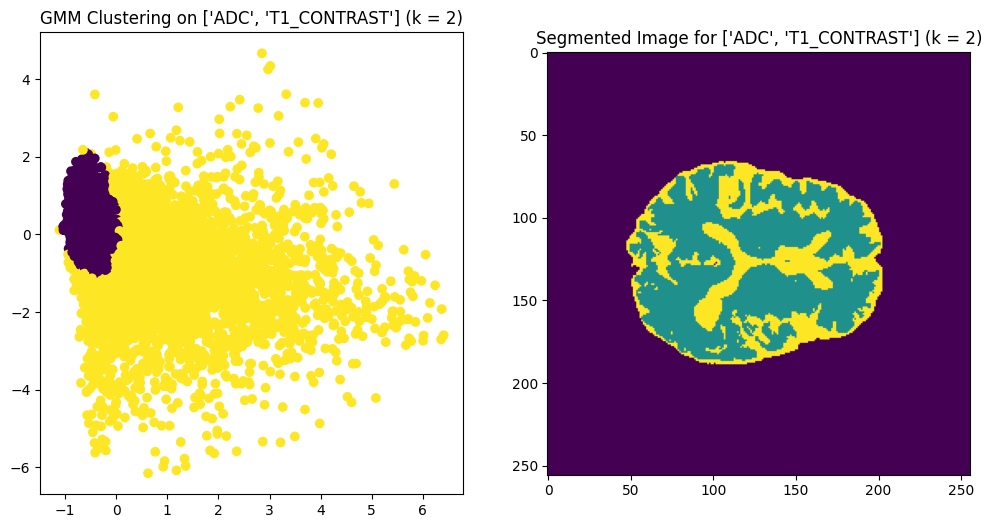

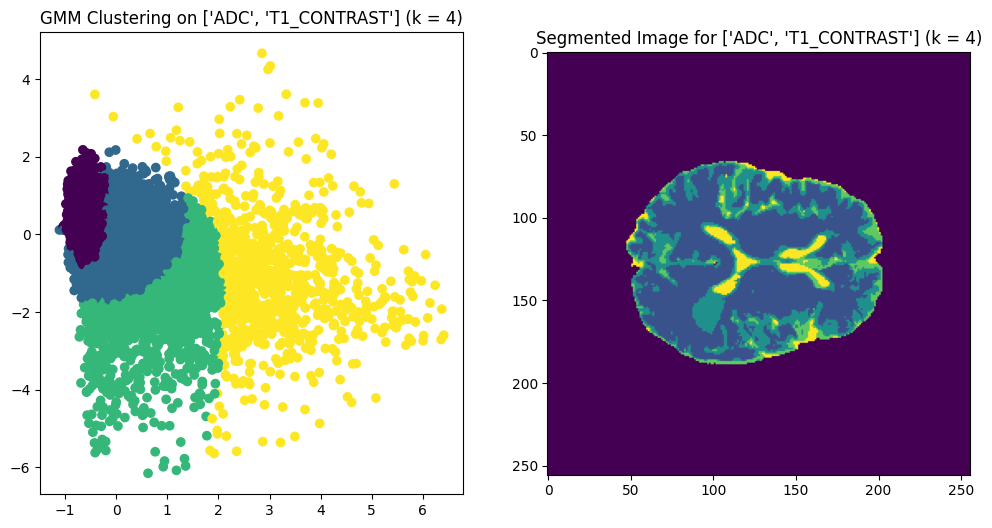

...

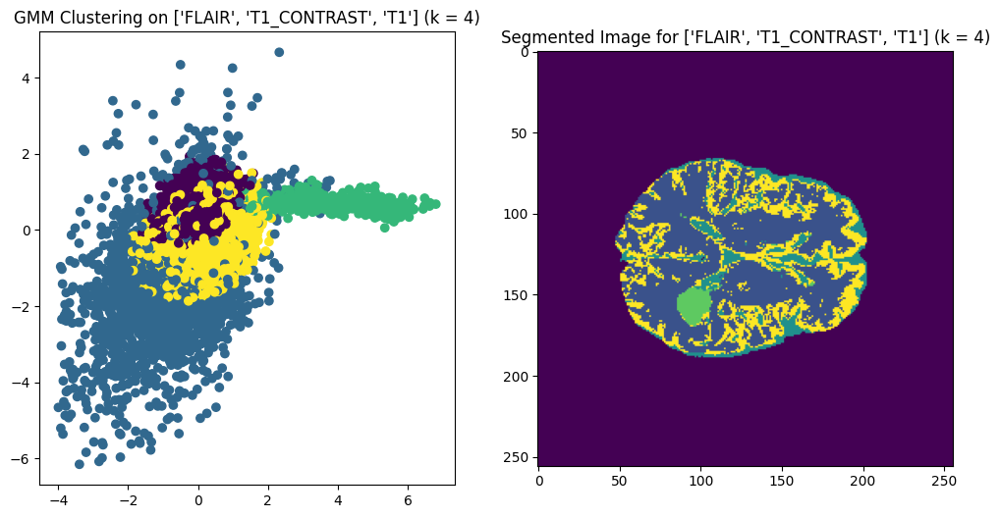

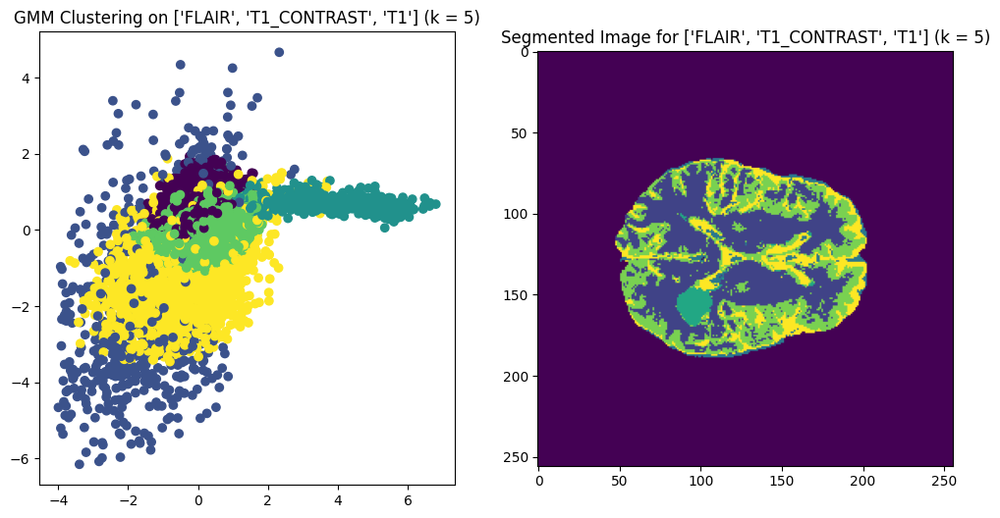

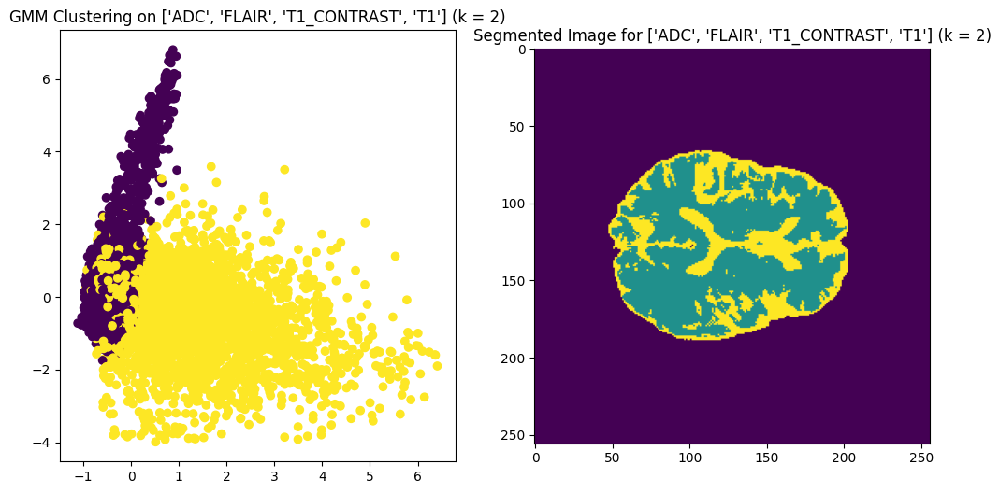

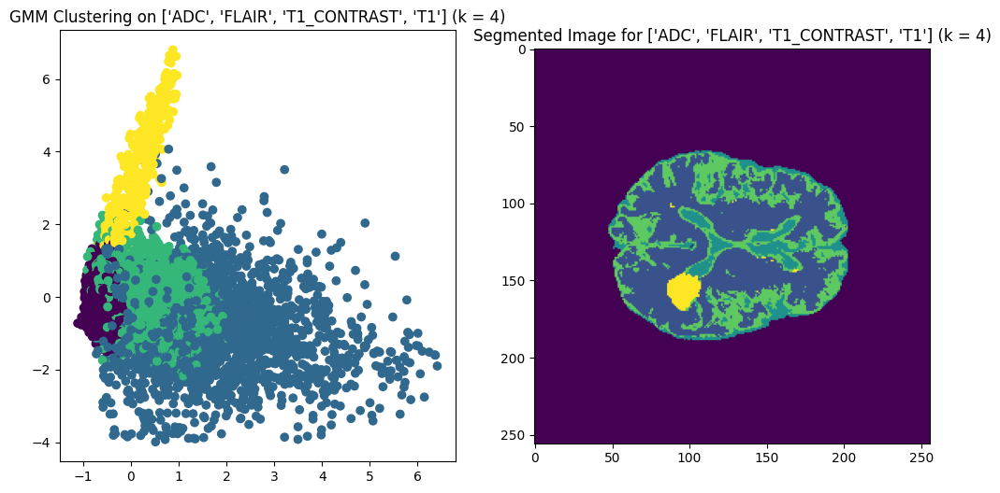

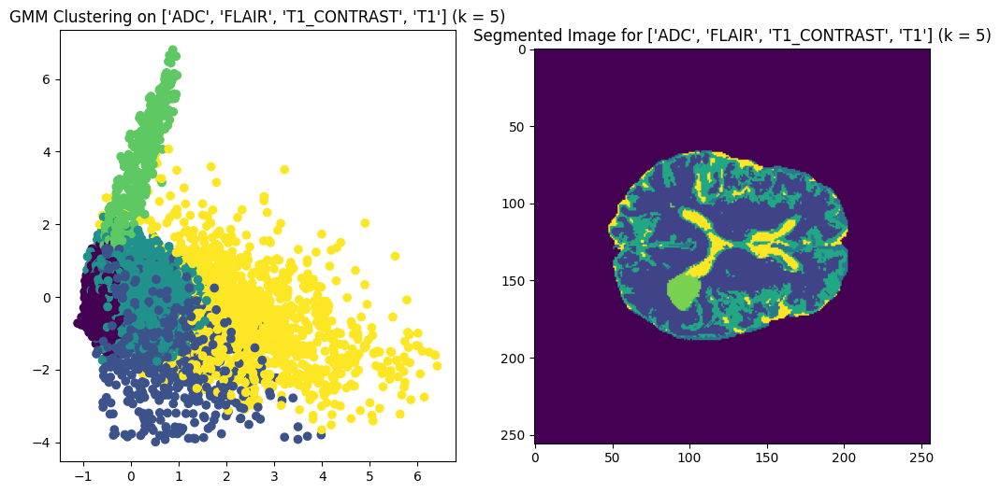

In [27]:
# Identify the number of features (number of images being used)
num_features = all_img_scaled.shape[1]

# Define the corresponding image names for clarity 
image_names = ["ADC", "FLAIR", "T1_CONTRAST", "T1"]

# Loop through different numbers of earlier identified features(combinations of 2,3, or all 4 images)
for num_selected in range(2, 5):  

    # Generate all posible feature combinations from the image files 
    for subset in combinations(range(num_features), num_selected): 

        # Select feature names corresponding to the subset  
        selected_names = [image_names[i] for i in subset]

        # Select the corresponding feature values form the identified scaled image data
        selected_features = all_img_scaled[:, subset]
        
        # Loop through differnet numbers of clusters(selected based on silhouette scores) to analyze clustering performance 
        for n_clusters in [2,4,5]:

            # Apply GaussianMixture() clustering with the selected number of clusters and get cluster labels 
            gmm = GaussianMixture(n_clusters, random_state= 42)
            labels = gmm.fit_predict(selected_features)

            # Shift labels to start from 1 for visualization clarity 
            labels += 1
            
            # For visualization, create an empty image mask that maches the original image shape 
            all_img_labels_mapped = zeros(data_slice1.shape)

            # Make sure that labels are only assigned to nonzero pixels 
            all_img_labels_mapped[mask] = labels
            
            # Plot the clustering results 
            fig, ax = subplots(1, 2, figsize=(12, 6))
            
            # Show the scatter plot of the selected feature space  with cluster labels 
            ax[0].scatter(selected_features[:, 0], selected_features[:, 1], c=labels, cmap="viridis")
            ax[0].set_title(f"GMM Clustering on {selected_names} (k = {n_clusters})")
            
            # Display the segmented image based on clustering 
            ax[1].imshow(all_img_labels_mapped[:, :], cmap='viridis')
            ax[1].set_title(f"Segmented Image for {selected_names} (k = {n_clusters})")

            show()

#MTS: Correct use of random state, for reproducibility.
#MTS: Correct repeating of above workflow, using GMM instead of KMeans.

In [ ]:
#MTS: Good observations given below for the differences between GMM and KMeans.

Note: 

For the validity of the results I have used scaled data in the GMM aplication, as I used the results for the comaprison taken from the KMeans application on the sclaed data as well. I aslo have done this as GMM aplication on the scaled data ensures consistent and meaningful clustering results.

Answer:

1 - Scatter Plot Differences
KMeans:
The clusters in KMeans appear more evenly distributed and separated. The boundaries between clusters are clearer and more rigid, as KMeans forces hard assignments. In some cases, the clusters look more spread out compared to GMM.
GMM:
Clustering appears smoother and more blended, as points are assigned probabilities of belonging to multiple clusters rather than a single hard assignment. This results in a more gradual transition between clusters.

2 - Brain Slices Differences
KMeans: 
The segmented brain images show sharp, well-defined regions due to the strict assignment of pixels. However, some areas may appear noisier or incorrectly segmented, as KMeans enforces rigid boundaries.
GMM: 
The segmented images appear smoother and more continuous, as GMM allows partial membership across regions. This leads to more natural-looking segmentations but may also cause blending between tissue types.









In [ ]:
#MTS: Overall this assignment has been done quite well and the codes and outputs provided are mostly correct. Therefore, this work merits
#a low distinction as understanding of the assignment content and more advanced machine learning methods is evident. See the MTS 
#comments above and the model answers for more details on suggested enhancements to your assignment, as there are a few things that
#should be added to this work.